In [1]:
import numpy as np
import pandas as pd
import nmrglue as ng
import nibabel as nib

import matplotlib.pyplot as plt

from scipy.io import loadmat
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.cluster import KMeans

from sklearn.metrics import adjusted_mutual_info_score as AMI

from nmrglue.process.proc_base import fft
from contrastive import CPCA
import imageio
import ants
import pickle

In [2]:
import os
os.environ["OMP_NUM_THREADS"] = "2"
os.environ["MKL_NUM_THREADS"] = "2"
os.environ["OPENBLAS_NUM_THREADS"] = "2"

In [3]:
Control1_spectra = np.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/Control/Control01/Control01_complex_sum_re.npy')
Control2_spectra = np.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/Control/Control02/Control02_complex_sum_re_ws.npy')
Control3_spectra = np.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/Control/Control03/Control03_complex_sum_re_ws.npy')
Control4_spectra = np.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/Control/Control04/Control04_complex_sum_re_ws.npy')

Control1_spectra_re = Control1_spectra.reshape(32,64,64,2048)
Control2_spectra_re = Control2_spectra.reshape(32,64,64,2048)
Control3_spectra_re = Control3_spectra.reshape(32,64,64,2048)
Control4_spectra_re = Control4_spectra.reshape(32,64,64,2048)

In [5]:
RMS01_spectra = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/RMS01_complex_sum_REF.nii').dataobj)
RMS02_spectra = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/RMS02_complex_sum_redone.nii').dataobj)
RMS03_spectra = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/RMS03_complex_sum_redone.nii').dataobj)
RMS05_spectra = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/RMS05_complex_sum_redone.nii').dataobj)

RMS01_spectra_re = RMS01_spectra.reshape(32,64,64,2048)
RMS02_spectra_re = RMS02_spectra.reshape(32,64,64,2048)
RMS03_spectra_re = RMS03_spectra.reshape(32,64,64,2048)
RMS05_spectra_re = RMS05_spectra.reshape(32,64,64,2048)

In [4]:
RMS01_spectra1 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/RMS01_complex_sum_REF.nii').dataobj)


In [5]:
RMS01_spectra = RMS01_spectra.reshape(32*64*64, 2048)
mask = RMS01_spectra[:,-1] != 0
RMS01 = RMS01_spectra[mask]

In [6]:
RMS01_spectra_ref = RMS01_spectra1.reshape(32*64*64, 2048)
RMS01_REF = RMS01_spectra_ref[mask]

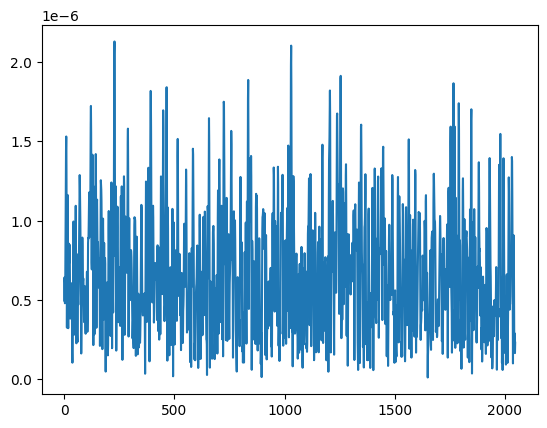

In [26]:
plt.plot(RMS01[1,:])


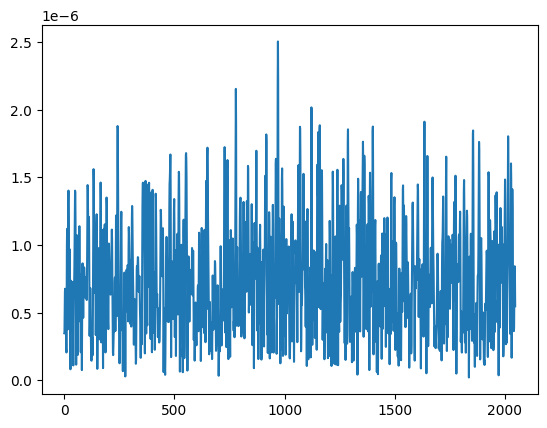

In [27]:
plt.plot(RMS01_REF[1,:])


In [85]:
Control1_spectra_one = Control1_spectra_re[:,:,:,1050]
Control2_spectra_one = Control2_spectra_re[:,:,:,1050]
Control3_spectra_one = Control3_spectra_re[:,:,:,1050]
Control4_spectra_one = Control4_spectra_re[:,:,:,1050]

RMS01_spectra_one = RMS01_spectra_re[:,:,:,1030]
RMS02_spectra_one = RMS02_spectra_re[:,:,:,1030]
RMS03_spectra_one = RMS03_spectra_re[:,:,:,1030]
RMS05_spectra_one = RMS05_spectra_re[:,:,:,1050]

In [93]:
#saving (samples, features for CPCA)
import nibabel as nib
ni_img = nib.Nifti1Image(RMS05_spectra_one, affine=np.eye(4))
nib.save(ni_img, "/data/MRSI/Naren2/MRSI/RMS05_V3/RMS05_spectra_one_ws.nii")

Warping data to put everything in same space

In [4]:
Control1_spectra = nib.load("/data/MRSI/Naren2/MRSI/Control01/Control01_spectra_one_ws.nii").dataobj
Control2_spectra = nib.load("/data/MRSI/Naren2/MRSI/Control02/Control02_spectra_one_ws.nii").dataobj
Control3_spectra = nib.load("/data/MRSI/Naren2/MRSI/Control03/Control03_spectra_one_ws.nii").dataobj
Control4_spectra = nib.load("/data/MRSI/Naren2/MRSI/Control04/Control04_spectra_one_ws.nii").dataobj

RMS01_spectra = nib.load("/data/MRSI/Naren2/MRSI/RMS01_V3/RMS01_spectra_one_ws.nii").dataobj
RMS02_spectra = nib.load("/data/MRSI/Naren2/MRSI/RMS02_V3/RMS02_spectra_one_ws.nii").dataobj
RMS03_spectra = nib.load("/data/MRSI/Naren2/MRSI/RMS03_V3/RMS03_spectra_one_ws.nii").dataobj
RMS05_spectra = nib.load("/data/MRSI/Naren2/MRSI/RMS05_V3/RMS05_spectra_one_ws.nii").dataobj

Control1_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/Control01/Control01_spectra_one_ss_labels.tiff").transpose()
Control2_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/Control02/Control02_spectra_one_ss_labels.tif").transpose()
Control3_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/Control03/Control03_spectra_one_ss_labels.tif").transpose()
Control4_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/Control04/Control04_spectra_one_ss_labels.tiff").transpose()

RMS01_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/RMS01_V3/RMS01_spectra_one_ss_labels.tiff").transpose()
RMS02_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/RMS02_V3/RMS02_spectra_one_ss_labels.tiff").transpose()
RMS03_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/RMS03_V3/RMS03_spectra_one_ss_labels.tiff").transpose()
RMS05_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/RMS05_V3/RMS05_spectra_one_ss_labels.tif").transpose()

/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/302134285.py:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  Control1_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/Control01/Control01_spectra_one_ss_labels.tiff").transpose()
/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/302134285.py:12: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  Control2_spectra_ss_labels = imageio.imread("/data/MRSI/Naren2/MRSI/Control02/Control02_spectra_one_ss_labels.tif").transpose()
/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/302134285.py:13: D

In [5]:
RMS01_ss = np.ma.masked_where(RMS01_spectra_ss_labels<1, RMS01_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS01_ss_mask = np.ma.getmask(RMS01_ss) #get only mask (True False) values
RMS01_ss = np.where(RMS01_ss_mask, 0, RMS01_ss) #where mask is True (and value is 'masked'), make it 0 and keep everything else
RMS02_ss = np.ma.masked_where(RMS02_spectra_ss_labels<1, RMS02_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS03_ss = np.ma.masked_where(RMS03_spectra_ss_labels<1, RMS03_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS05_ss = np.ma.masked_where(RMS05_spectra_ss_labels<1, RMS05_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)

/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/2187583396.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  RMS01_ss = np.ma.masked_where(RMS01_spectra_ss_labels<1, RMS01_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/2187583396.py:4: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  RMS02_ss = np.ma.masked_where(RMS02_spectra_ss_labels<1, RMS02_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/2187583396.py:5: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  RMS03_ss = np.ma.masked_where(RMS03_spectra_ss_lab

In [6]:
RMS01_ss = np.ma.masked_where(RMS01_spectra_ss_labels<1, RMS01_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS01_ss_mask = np.ma.getmask(RMS01_ss) #get only mask (True False) values
RMS01_ss = np.where(RMS01_ss_mask, 0, RMS01_ss) #where mask is True (and value is 'masked'), make it 0 and keep everything else

RMS02_ss = np.ma.masked_where(RMS02_spectra_ss_labels<1, RMS02_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS02_ss_mask = np.ma.getmask(RMS02_ss) #get only mask (True False) values
RMS02_ss = np.where(RMS02_ss_mask, 0, RMS02_ss) #where mask is True (and value is 'masked'), make it 0 and keep everything else

RMS03_ss = np.ma.masked_where(RMS03_spectra_ss_labels<1, RMS03_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS03_ss_mask = np.ma.getmask(RMS03_ss) #get only mask (True False) values
RMS03_ss = np.where(RMS03_ss_mask, 0, RMS03_ss) #where mask is True (and value is 'masked'), make it 0 and keep everything else

RMS05_ss = np.ma.masked_where(RMS05_spectra_ss_labels<1, RMS05_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
RMS05_ss_mask = np.ma.getmask(RMS05_ss) #get only mask (True False) values
RMS05_ss = np.where(RMS05_ss_mask, 0, RMS05_ss) #where mask is True (and value is 'masked'), make it 0 and keep everything else

/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/627745555.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  RMS01_ss = np.ma.masked_where(RMS01_spectra_ss_labels<1, RMS01_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/627745555.py:5: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  RMS02_ss = np.ma.masked_where(RMS02_spectra_ss_labels<1, RMS02_spectra) #mask values that are less than 1 in spectral data (gives hyperintensities)
/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/ipykernel_2389920/627745555.py:9: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  RMS03_ss = np.ma.masked_where(RMS03_spectra_ss_labels

In [7]:
flair_1 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/ms/RMS01/RMS01_flair_ss_256.nii').dataobj)
flair_2 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/RMS02_flair_ss_256.nii').dataobj)
flair_3 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/ms/RMS03/RMS03_flair_ss_256.nii').dataobj)
flair_5 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/RMS05_flair_ss_256.nii').dataobj)

In [8]:
flair_1_tp = np.rot90(np.fliplr(flair_1))
flair_2_tp = np.rot90(np.fliplr(flair_2))
flair_3_tp = np.flip(np.transpose(flair_3, (2,1,0)))
flair_5_tp = np.rot90(np.fliplr(flair_5))

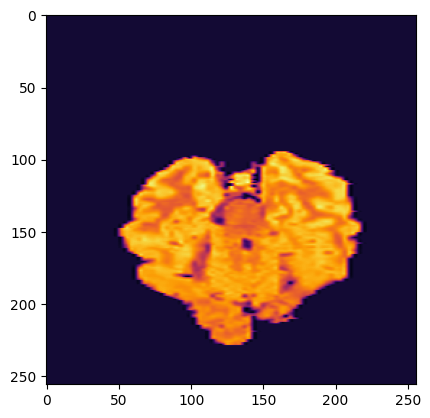

In [11]:
plt.imshow(flair_5_tp[140,:,:],cmap='inferno')

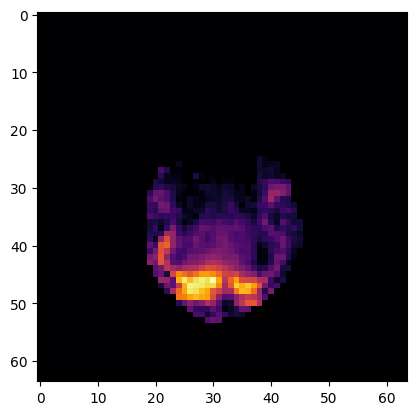

In [9]:
plt.imshow(RMS05_ss[23,:,:],cmap='inferno')

In [12]:
RMS01_spectra_ants = ants.from_numpy(RMS01_ss)
RMS02_spectra_ants = ants.from_numpy(RMS02_ss)
RMS03_spectra_ants = ants.from_numpy(RMS03_ss)
RMS05_spectra_ants = ants.from_numpy(RMS05_ss)

RMS01_flair_ants = ants.from_numpy(flair_1_tp)
RMS02_flair_ants = ants.from_numpy(flair_2_tp)
RMS03_flair_ants = ants.from_numpy(flair_3_tp)
RMS05_flair_ants = ants.from_numpy(flair_5_tp)

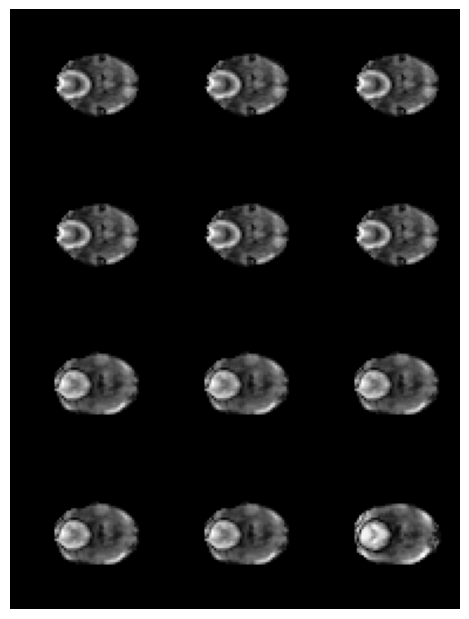

In [13]:
ants.plot(RMS01_spectra_ants)

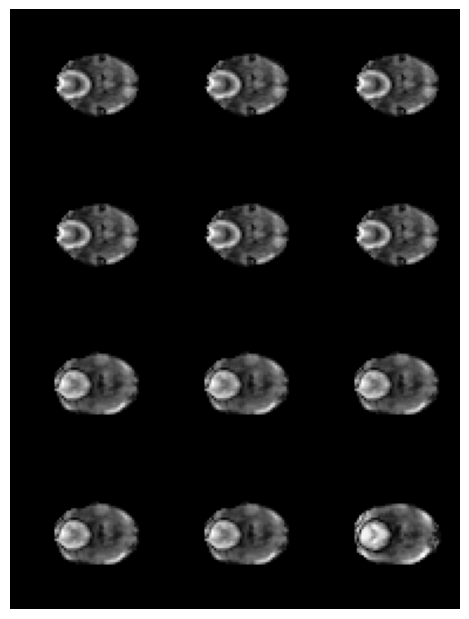

In [11]:
ants.plot(RMS01_spectra_ants)

In [14]:
RMS01_flair_ants_re = ants.resample_image(RMS01_flair_ants, (32, 64, 64), use_voxels=True, interp_type=1)
RMS02_flair_ants_re = ants.resample_image(RMS02_flair_ants, (32, 64, 64), use_voxels=True, interp_type=1)
RMS03_flair_ants_re = ants.resample_image(RMS03_flair_ants, (32, 64, 64), use_voxels=True, interp_type=1)
RMS05_flair_ants_re = ants.resample_image(RMS05_flair_ants, (32, 64, 64), use_voxels=True, interp_type=1)

In [15]:
RMS01_flair_ants_re.set_spacing((1,1,1))
RMS02_flair_ants_re.set_spacing((1,1,1))
RMS03_flair_ants_re.set_spacing((1,1,1))
RMS05_flair_ants_re.set_spacing((1,1,1))

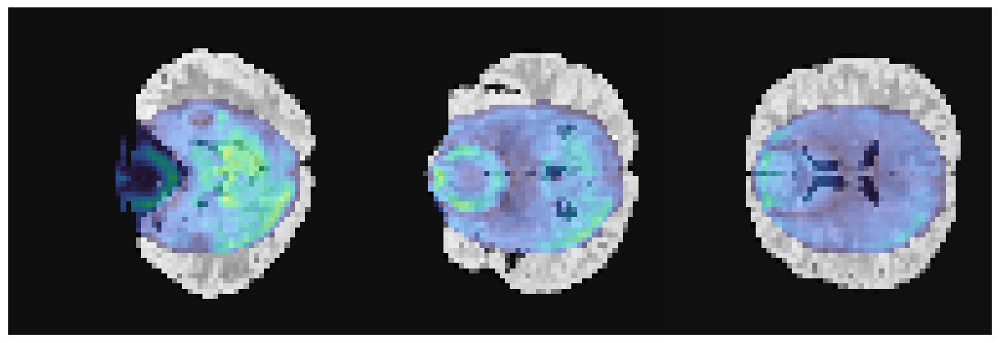

In [16]:
ants.plot(RMS02_flair_ants_re, overlay=RMS02_spectra_ants, overlay_alpha = 0.5, axis=0, nslices=3, figsize=4)

In [17]:
RMS01_flair2spectra = ants.registration(fixed = RMS01_spectra_ants,
                                moving = RMS01_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [15]:
RMS02_flair2spectra = ants.registration(fixed = RMS02_spectra_ants,
                                moving = RMS02_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [19]:
RMS03_flair2spectra = ants.registration(fixed = RMS03_spectra_ants,
                                moving = RMS03_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [20]:
RMS05_flair2spectra = ants.registration(fixed = RMS05_spectra_ants,
                                moving = RMS05_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [123]:
import pickle 
  
try: 
    geeky_file = open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/RMS05_flair2spectradict_ws', 'wb') 
    pickle.dump(RMS05_flair2spectra, geeky_file) 
    geeky_file.close() 
  
except: 
    print("Something went wrong")

In [18]:
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/redo/RMS01_flair2spectradict', 'rb') as f:
    RMS01_flair2spectra = pickle.load(f)
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/redo/RMS02_flair2spectradict', 'rb') as f:
    RMS02_flair2spectra = pickle.load(f)
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/redo/RMS03_flair2spectradict', 'rb') as f:
    RMS03_flair2spectra = pickle.load(f)
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/RMS05_flair2spectradict', 'rb') as f:
    RMS05_flair2spectra = pickle.load(f)

In [19]:
RMS05_flair2spectra

{'warpedmovout': ANTsImage (RAI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (32, 64, 64)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.],
 'warpedfixout': ANTsImage (RAI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (32, 64, 64)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.],
 'fwdtransforms': ['/tmp/tmp01jrqs_t1Warp.nii.gz',
  '/tmp/tmp01jrqs_t0GenericAffine.mat'],
 'invtransforms': ['/tmp/tmp01jrqs_t0GenericAffine.mat',
  '/tmp/tmp01jrqs_t1InverseWarp.nii.gz']}

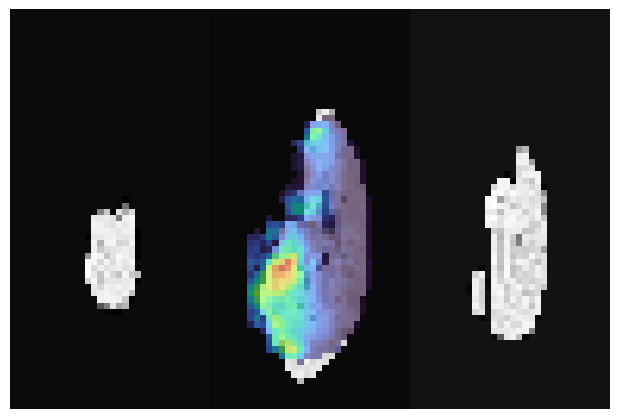

In [22]:
ants.plot(RMS02_flair_ants_re, overlay=RMS02_spectra_ants, overlay_alpha = 0.6, axis=2, nslices=3, figsize=4)

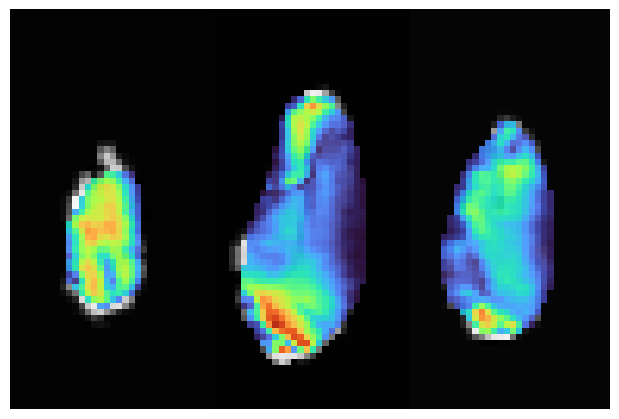

In [25]:
ants.plot(RMS05_flair2spectra['warpedmovout'], overlay=RMS05_spectra_ants, overlay_alpha = 0.9, axis=2, nslices=3, figsize=4)

In [ ]:
RMS01_flair2spectra['warpedmovout']

In [35]:
#warping flair2spectra directly to highres
RMS01_flair2spectra_re_highres = ants.resample_image(RMS01_flair2spectra['warpedmovout'], (256, 256, 256), use_voxels=True, interp_type=1)
RMS02_flair2spectra_re_highres = ants.resample_image(RMS02_flair2spectra['warpedmovout'], (256, 256, 256), use_voxels=True, interp_type=1)
RMS03_flair2spectra_re_highres = ants.resample_image(RMS03_flair2spectra['warpedmovout'], (256, 256, 256), use_voxels=True, interp_type=1)
RMS05_flair2spectra_re_highres = ants.resample_image(RMS05_flair2spectra['warpedmovout'], (256, 256, 256), use_voxels=True, interp_type=1)
RMS01_flair2spectra_re_highres.set_spacing((1,1,1))
RMS02_flair2spectra_re_highres.set_spacing((1,1,1))
RMS03_flair2spectra_re_highres.set_spacing((1,1,1))
RMS05_flair2spectra_re_highres.set_spacing((1,1,1))

In [27]:
RMS01_flair2spectra_re_highres

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 256)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [28]:
RMS01_flair_ants

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 256)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [36]:
RMS01_flair2spectra_2highres = ants.registration(fixed = RMS01_flair_ants,
                                moving = RMS01_flair2spectra_re_highres, 
                                type_of_transform = 'SyN',aff_metric='mattes')
RMS02_flair2spectra_2highres = ants.registration(fixed = RMS02_flair_ants,
                                moving = RMS02_flair2spectra_re_highres, 
                                type_of_transform = 'SyN',aff_metric='mattes')
RMS03_flair2spectra_2highres = ants.registration(fixed = RMS03_flair_ants,
                                moving = RMS03_flair2spectra_re_highres, 
                                type_of_transform = 'SyN',aff_metric='mattes')
RMS05_flair2spectra_2highres = ants.registration(fixed = RMS05_flair_ants,
                                moving = RMS05_flair2spectra_re_highres, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [31]:
ms1_arr_hy_wlabels_re_onlylabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/redo/ms1_arr_hy_wlabels_re_onlylabels_4c_ws.nii").dataobj)
ms2_arr_hy_wlabels_re_onlylabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/redo/ms2_arr_hy_wlabels_re_onlylabels_4c_ws.nii").dataobj)
ms3_arr_hy_wlabels_re_onlylabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/redo/ms3_arr_hy_wlabels_re_onlylabels_4c_ws.nii").dataobj)
ms5_arr_hy_wlabels_re_onlylabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/ms5_arr_hy_wlabels_re_onlylabels_4c_ws.nii").dataobj)

In [21]:
RMS02_hy_clustered_ants_re_highres

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 256)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [22]:
RMS02_flair2spectra_2highres['warpedmovout']

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 256)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [32]:
RMS01_hy_clustered_ants = ants.from_numpy(ms1_arr_hy_wlabels_re_onlylabels)
RMS02_hy_clustered_ants = ants.from_numpy(ms2_arr_hy_wlabels_re_onlylabels)
RMS03_hy_clustered_ants = ants.from_numpy(ms3_arr_hy_wlabels_re_onlylabels)
RMS05_hy_clustered_ants = ants.from_numpy(ms5_arr_hy_wlabels_re_onlylabels)

In [32]:
#warping lowres clustered labels directly to highres using fwdtransforms
RMS01_hy_clustered_ants_re_highres = ants.resample_image(RMS01_hy_clustered_ants, (256, 256, 256), use_voxels=True, interp_type=1)
RMS02_hy_clustered_ants_re_highres = ants.resample_image(RMS02_hy_clustered_ants, (256, 256, 256), use_voxels=True, interp_type=1)
RMS03_hy_clustered_ants_re_highres = ants.resample_image(RMS03_hy_clustered_ants, (256, 256, 256), use_voxels=True, interp_type=1)
RMS05_hy_clustered_ants_re_highres = ants.resample_image(RMS05_hy_clustered_ants, (256, 256, 256), use_voxels=True, interp_type=1)
RMS01_hy_clustered_ants_re_highres.set_spacing((1,1,1))
RMS02_hy_clustered_ants_re_highres.set_spacing((1,1,1))
RMS03_hy_clustered_ants_re_highres.set_spacing((1,1,1))
RMS05_hy_clustered_ants_re_highres.set_spacing((1,1,1))

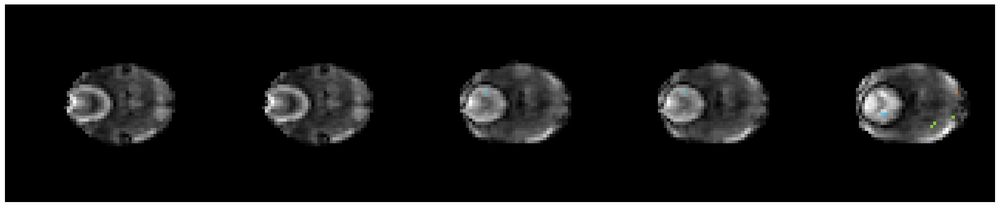

In [118]:
ants.plot(RMS01_spectra_ants, overlay=RMS01_hy_clustered_ants, alpha = 1, cmap = 'grey', overlay_alpha=0.7, axis=0, nslices=5, figsize=4)

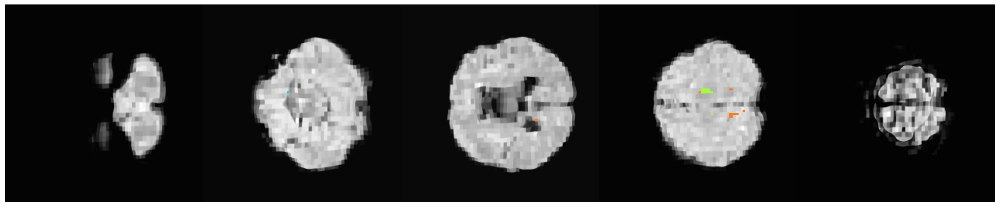

In [117]:
ants.plot(RMS01_flair2spectra_2highres['warpedmovout'], overlay=RMS01_hy_clustered_ants_re_highres, alpha = 0.5, cmap = 'grey', overlay_alpha=1, axis=0, nslices=5, figsize=4)

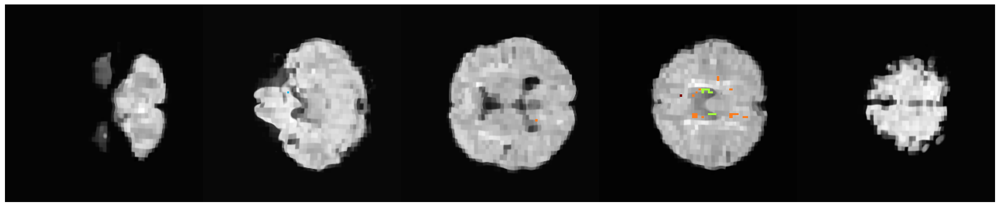

In [37]:
ants.plot(RMS01_flair2spectra_2highres['warpedmovout'], overlay=RMS01_hy_clustered_ants_re_highres, alpha = 0.5, cmap = 'grey', overlay_alpha=1, axis=0, nslices=5, figsize=4)

In [38]:
hylabelsRMS01_clustered_2highres = ants.apply_transforms(fixed=RMS01_flair_ants, moving=RMS01_hy_clustered_ants_re_highres, transformlist= RMS01_flair2spectra_2highres['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
hylabelsRMS02_clustered_2highres = ants.apply_transforms(fixed=RMS02_flair_ants, moving=RMS02_hy_clustered_ants_re_highres, transformlist= RMS02_flair2spectra_2highres['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
hylabelsRMS03_clustered_2highres = ants.apply_transforms(fixed=RMS03_flair_ants, moving=RMS03_hy_clustered_ants_re_highres, transformlist= RMS03_flair2spectra_2highres['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
hylabelsRMS05_clustered_2highres = ants.apply_transforms(fixed=RMS05_flair_ants, moving=RMS05_hy_clustered_ants_re_highres, transformlist= RMS05_flair2spectra_2highres['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)

['-d', '3', '-i', '0x7f1efd4f1908', '-o', '0x7f1efd4f1f08', '-r', '0x7f1efd4f1828', '-n', 'nearestNeighbor', '-t', '/tmp/tmpach4rlo81Warp.nii.gz', '-t', '/tmp/tmpach4rlo80GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f1efd4f1908
Could not create ImageIO for the input file, assuming dimension = 3 and scalar pixel type
Reference image: 0x7f1efd4f1828
The composite transform comprises the following transforms (in order): 
  1. /tmp/tmpach4rlo80GenericAffine.mat (type = AffineTransform)
  2. /tmp/tmpach4rlo81Warp.nii.gz (type = DisplacementFieldTransform)
Default pixel value: 0
Interpolation type: NearestNeighborInterpolateImageFunction
Output warped image: 0x7f1efd4f1f08
['-d', '3', '-i', '0x7f1f95115888', '-o', '0x7f1efd4f1a88', '-r', '0x7f1efd4f1e88', '-n', 'nearestNeighbor', '-t', '/tmp/tmpmhrnzzcc1Warp.nii.gz', '-t', '/tmp/tmpmhrnzzcc0GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f1f95115888
Could not create I

In [39]:
np.count_nonzero(RMS02_hy_clustered_ants.numpy())

34

In [121]:
RMS02_hy_clustered_ants.shape

(32, 64, 64)

In [40]:
np.count_nonzero(hylabelsRMS02_clustered_2highres.numpy())

7376

In [41]:
hylabelsRMS02_clustered_2highres.shape

(256, 256, 256)

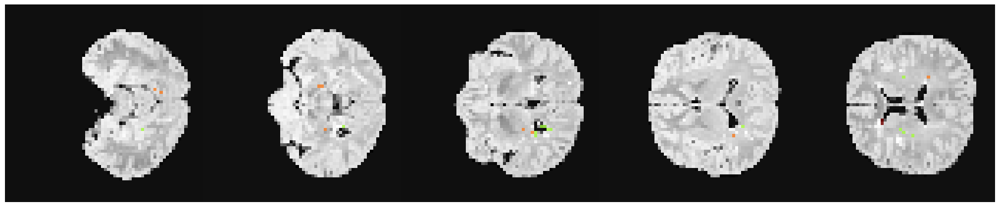

In [124]:
ants.plot(RMS02_flair_ants_re, overlay=RMS02_hy_clustered_ants, overlay_alpha = 0.8, axis=0, nslices=5, figsize=4, overlay_cmap = 'turbo')

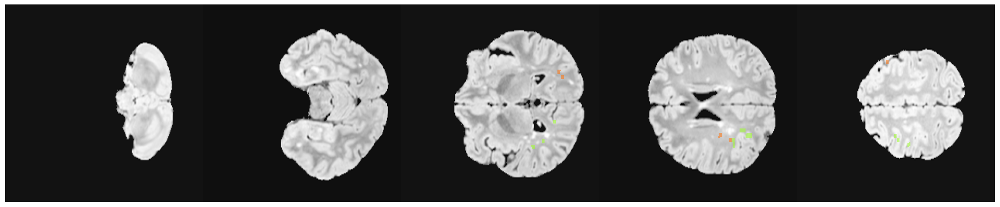

In [125]:
ants.plot(RMS02_flair_ants, overlay=hylabelsRMS02_clustered_2highres, overlay_alpha = 0.6, axis=0, nslices=5, figsize=4, overlay_cmap = 'turbo')

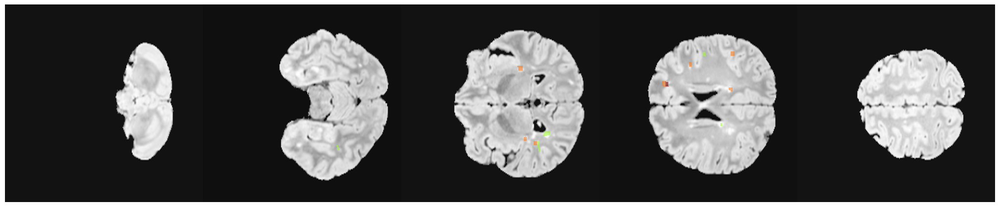

In [42]:
ants.plot(RMS02_flair_ants, overlay=hylabelsRMS02_clustered_2highres, overlay_alpha = 0.6, axis=0, nslices=5, figsize=4, overlay_cmap = 'turbo')

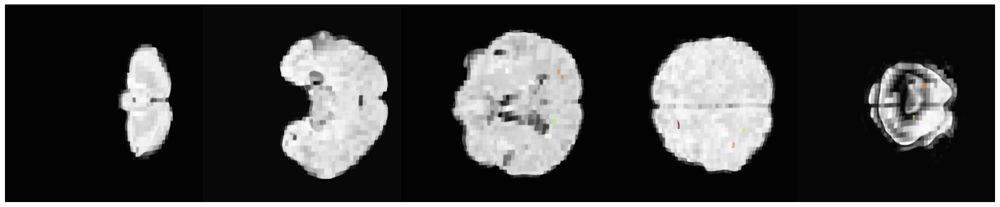

In [126]:
ants.plot(RMS02_flair2spectra_2highres['warpedmovout'], overlay=hylabelsRMS02_clustered_2highres, overlay_alpha = 0.6, axis=0, nslices=5, figsize=4)

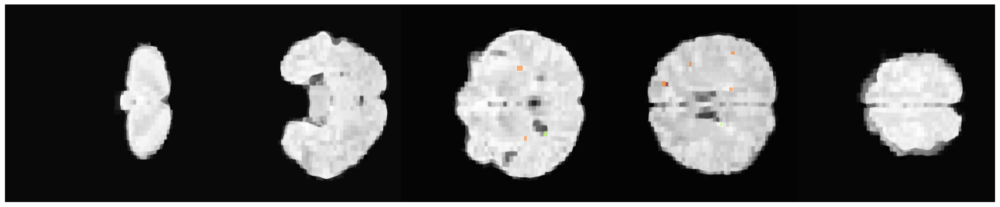

In [43]:
ants.plot(RMS02_flair2spectra_2highres['warpedmovout'], overlay=hylabelsRMS02_clustered_2highres, overlay_alpha = 0.6, axis=0, nslices=5, figsize=4)

In [45]:
hylabelsRMS01_clustered_2highres_resampled_npy = hylabelsRMS01_clustered_2highres.numpy()
hylabelsRMS02_clustered_2highres_resampled_npy = hylabelsRMS02_clustered_2highres.numpy()
hylabelsRMS03_clustered_2highres_resampled_npy = hylabelsRMS03_clustered_2highres.numpy()
hylabelsRMS05_clustered_2highres_resampled_npy = hylabelsRMS05_clustered_2highres.numpy()

In [128]:
hylabelsRMS01_clustered_2highres.unique()

array([0., 1., 2., 3., 4.], dtype=float32)

In [46]:
#saving hyperintensity label clusters projected back to high res as numpy
ni_img = nib.Nifti1Image(hylabelsRMS01_clustered_2highres_resampled_npy, affine=np.eye(4))
nib.save(ni_img, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/redo/hylabelsRMS01_clustered_2highres_resampled_ws_rwarp.nii")
ni_img2 = nib.Nifti1Image(hylabelsRMS02_clustered_2highres_resampled_npy, affine=np.eye(4))
nib.save(ni_img2, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/redo/hylabelsRMS02_clustered_2highres_resampled_ws_rwarp.nii")
ni_img3 = nib.Nifti1Image(hylabelsRMS03_clustered_2highres_resampled_npy, affine=np.eye(4))
nib.save(ni_img3, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/redo/hylabelsRMS03_clustered_2highres_resampled_ws_rwarp.nii")
ni_img4 = nib.Nifti1Image(hylabelsRMS05_clustered_2highres_resampled_npy, affine=np.eye(4))
nib.save(ni_img4, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/hylabelsRMS05_clustered_2highres_resampled_ws_rwarp.nii")

In [20]:
atlas = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/icbm452_atlas_warp5_sinc.nii').dataobj)

In [21]:
atlas.shape

(149, 188, 148, 1)

In [22]:
#removing last dimension
atlas = atlas[:,:,:,0]

In [23]:
atlas_tp = np.transpose(atlas)
atlas_tp_vflip = np.fliplr(atlas_tp)
atlas_tp_hflip = np.flipud(atlas_tp_vflip)

In [24]:
atlas_tp_hflip.shape

(148, 188, 149)

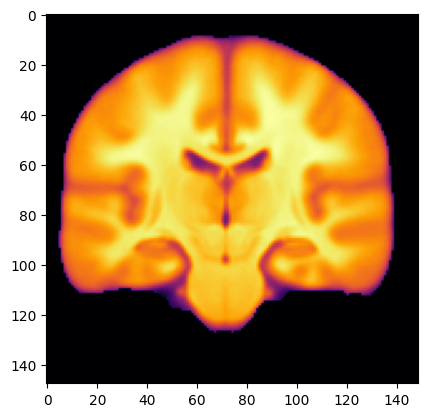

In [52]:
plt.imshow(atlas_tp_hflip[:,100,:],cmap='inferno')

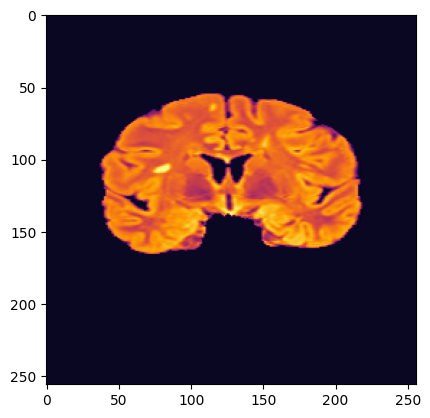

In [53]:
plt.imshow(RMS02_flair_ants.numpy()[:,130,:], cmap='inferno')

In [25]:
atlas_ants = ants.from_numpy(atlas_tp_hflip)

In [26]:
#IMPORTANT STEP. Make sure atlas has float datatype. Otherwise, registration won't work well
atlas_ants = atlas_ants.clone(pixeltype = 'float')

In [27]:
#warping flair2spectra directly to atlas
RMS01_flair2spectra_re_atlas = ants.resample_image(RMS01_flair2spectra['warpedmovout'], (148, 188, 149), use_voxels=True, interp_type=1)
RMS02_flair2spectra_re_atlas = ants.resample_image(RMS02_flair2spectra['warpedmovout'], (148, 188, 149), use_voxels=True, interp_type=1)
RMS03_flair2spectra_re_atlas = ants.resample_image(RMS03_flair2spectra['warpedmovout'], (148, 188, 149), use_voxels=True, interp_type=1)
RMS05_flair2spectra_re_atlas = ants.resample_image(RMS05_flair2spectra['warpedmovout'], (148, 188, 149), use_voxels=True, interp_type=1)
RMS01_flair2spectra_re_atlas.set_spacing((1,1,1))
RMS02_flair2spectra_re_atlas.set_spacing((1,1,1))
RMS03_flair2spectra_re_atlas.set_spacing((1,1,1))
RMS05_flair2spectra_re_atlas.set_spacing((1,1,1))

In [28]:
atlas_ants

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (148, 188, 149)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [29]:
RMS01_flair2spectra_re_atlas

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (148, 188, 149)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [62]:
RMS01_flair2spectra_2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS01_flair2spectra_re_atlas, 
                                type_of_transform = 'SyN',aff_metric='mattes')
RMS02_flair2spectra_2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS02_flair2spectra_re_atlas, 
                                type_of_transform = 'SyN',aff_metric='mattes')
RMS03_flair2spectra_2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS03_flair2spectra_re_atlas, 
                                type_of_transform = 'SyN',aff_metric='mattes')
RMS05_flair2spectra_2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS05_flair2spectra_re_atlas, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [33]:
RMS01_flair2spectra_2atlas

{'warpedmovout': ANTsImage (RAI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (148, 188, 149)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.],
 'warpedfixout': ANTsImage (RAI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (148, 188, 149)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.],
 'fwdtransforms': ['/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmp7ku9t15b1Warp.nii.gz',
  '/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmp7ku9t15b0GenericAffine.mat'],
 'invtransforms': ['/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmp7ku9t15b0GenericAffine.mat',
  '/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmp7ku9t15b1InverseWarp.nii.gz']}

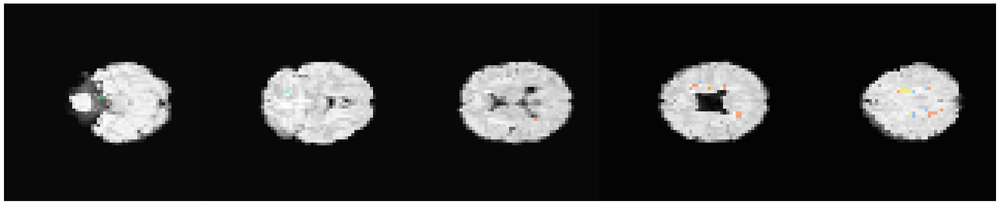

In [58]:
ants.plot(RMS01_flair2spectra['warpedmovout'], overlay = RMS01_hy_clustered_ants, overlay_alpha=0.5, figsize=5, nslices=5)

In [63]:
#warping lowres clustered labels directly to atlas using fwdtransforms
RMS01_hy_clustered_ants_re_atlas = ants.resample_image(RMS01_hy_clustered_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS02_hy_clustered_ants_re_atlas = ants.resample_image(RMS02_hy_clustered_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS03_hy_clustered_ants_re_atlas = ants.resample_image(RMS03_hy_clustered_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS05_hy_clustered_ants_re_atlas = ants.resample_image(RMS05_hy_clustered_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS01_hy_clustered_ants_re_atlas.set_spacing((1,1,1))
RMS02_hy_clustered_ants_re_atlas.set_spacing((1,1,1))
RMS03_hy_clustered_ants_re_atlas.set_spacing((1,1,1))
RMS05_hy_clustered_ants_re_atlas.set_spacing((1,1,1))

In [64]:
hylabelsRMS01_clustered_2atlas = ants.apply_transforms(fixed=atlas_ants, moving=RMS01_hy_clustered_ants_re_atlas, transformlist= RMS01_flair2spectra_2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
hylabelsRMS02_clustered_2atlas = ants.apply_transforms(fixed=atlas_ants, moving=RMS02_hy_clustered_ants_re_atlas, transformlist= RMS02_flair2spectra_2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
hylabelsRMS03_clustered_2atlas = ants.apply_transforms(fixed=atlas_ants, moving=RMS03_hy_clustered_ants_re_atlas, transformlist= RMS03_flair2spectra_2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
hylabelsRMS05_clustered_2atlas = ants.apply_transforms(fixed=atlas_ants, moving=RMS05_hy_clustered_ants_re_atlas, transformlist= RMS05_flair2spectra_2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)

['-d', '3', '-i', '0x7f0c11328548', '-o', '0x7f0c112faa48', '-r', '0x7f0b76f8ef08', '-n', 'nearestNeighbor', '-t', '/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmpyjck4waw1Warp.nii.gz', '-t', '/data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmpyjck4waw0GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f0c11328548
Could not create ImageIO for the input file, assuming dimension = 3 and scalar pixel type
Reference image: 0x7f0b76f8ef08
The composite transform comprises the following transforms (in order): 
  1. /data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmpyjck4waw0GenericAffine.mat (type = AffineTransform)
  2. /data/MRSI/Naren2/FURI2/mayomrs_aligned/CPCA/tmpyjck4waw1Warp.nii.gz (type = DisplacementFieldTransform)
Default pixel value: 0
Interpolation type: NearestNeighborInterpolateImageFunction
Output warped image: 0x7f0c112faa48
['-d', '3', '-i', '0x7f0c11328268', '-o', '0x7f0c112faa48', '-r', '0x7f0c11328548', '-n', 'nearestNeighbor', '-t', '/data/MRS

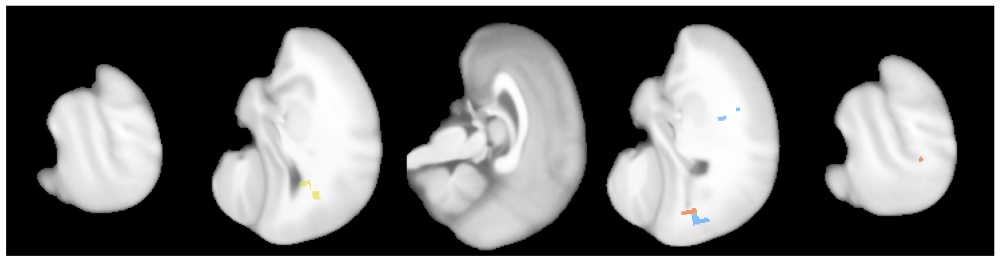

In [55]:
ants.plot(atlas_ants, overlay=hylabelsRMS02_clustered_2atlas, overlay_alpha = 0.6, axis=2, nslices=5, figsize=4)

In [45]:
hylabelsRMS02_clustered_2atlas

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (148, 188, 149)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

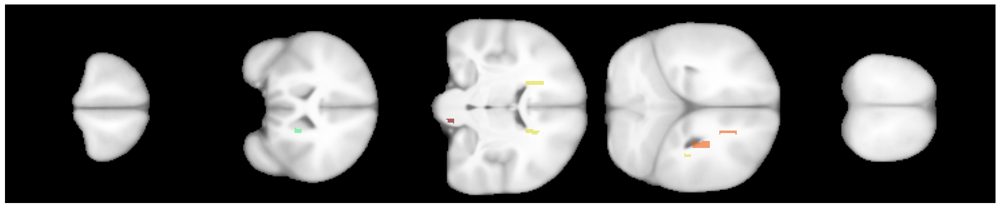

In [65]:
ants.plot(atlas_ants, overlay=hylabelsRMS01_clustered_2atlas, overlay_alpha = 0.6, axis=1, nslices=5, figsize=4)

In [66]:
hylabelsRMS01_clustered_2atlas_resampled_npy = hylabelsRMS01_clustered_2atlas.numpy()
hylabelsRMS02_clustered_2atlas_resampled_npy = hylabelsRMS02_clustered_2atlas.numpy()
hylabelsRMS03_clustered_2atlas_resampled_npy = hylabelsRMS03_clustered_2atlas.numpy()
hylabelsRMS05_clustered_2atlas_resampled_npy = hylabelsRMS05_clustered_2atlas.numpy()

In [43]:
np.unique(hylabelsRMS05_clustered_2atlas_resampled_npy)

array([0., 1., 3., 4.], dtype=float32)

In [53]:
#saving hyperintensity label clusters projected back to high res as numpy
ni_img = nib.Nifti1Image(hylabelsRMS01_clustered_2atlas_resampled_npy, affine=np.eye(4))
nib.save(ni_img, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/redo/hylabelsRMS01_clustered_2atlas_ws_rwarp.nii")
ni_img2 = nib.Nifti1Image(hylabelsRMS02_clustered_2atlas_resampled_npy, affine=np.eye(4))
nib.save(ni_img2, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/redo/hylabelsRMS02_clustered_2atlas_ws_rwarp.nii")
ni_img3 = nib.Nifti1Image(hylabelsRMS03_clustered_2atlas_resampled_npy, affine=np.eye(4))
nib.save(ni_img3, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/redo/hylabelsRMS03_clustered_2atlas_ws_rwarp.nii")
ni_img4 = nib.Nifti1Image(hylabelsRMS05_clustered_2atlas_resampled_npy, affine=np.eye(4))
nib.save(ni_img4, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/hylabelsRMS05_clustered_2atlas_ws_rwarp.nii")

In [ ]:
test1 = nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/redo/hylabelsRMS01_clustered_2atlas.nii").dataobj
test2 = nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/redo/hylabelsRMS02_clustered_2atlas.nii").dataobj
test3 = nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/redo/hylabelsRMS03_clustered_2atlas.nii").dataobj
test5 = nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/hylabelsRMS05_clustered_2atlas.nii").dataobj

In [ ]:
np.unique(test1)

In [ ]:
np.unique(test2)

In [ ]:
np.unique(test3)

In [ ]:
np.unique(test5)

In [68]:
RMS01_flair_ants_re = ants.resample_image(RMS01_flair_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS02_flair_ants_re = ants.resample_image(RMS02_flair_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS03_flair_ants_re = ants.resample_image(RMS03_flair_ants, (148, 188, 149), use_voxels=True, interp_type=1)
RMS05_flair_ants_re = ants.resample_image(RMS05_flair_ants, (148, 188, 149), use_voxels=True, interp_type=1)

In [69]:
RMS01_flair_ants_re.set_spacing((1,1,1))
RMS02_flair_ants_re.set_spacing((1,1,1))
RMS03_flair_ants_re.set_spacing((1,1,1))
RMS05_flair_ants_re.set_spacing((1,1,1))

In [70]:
RMS01_flair_ants_re

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (148, 188, 149)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

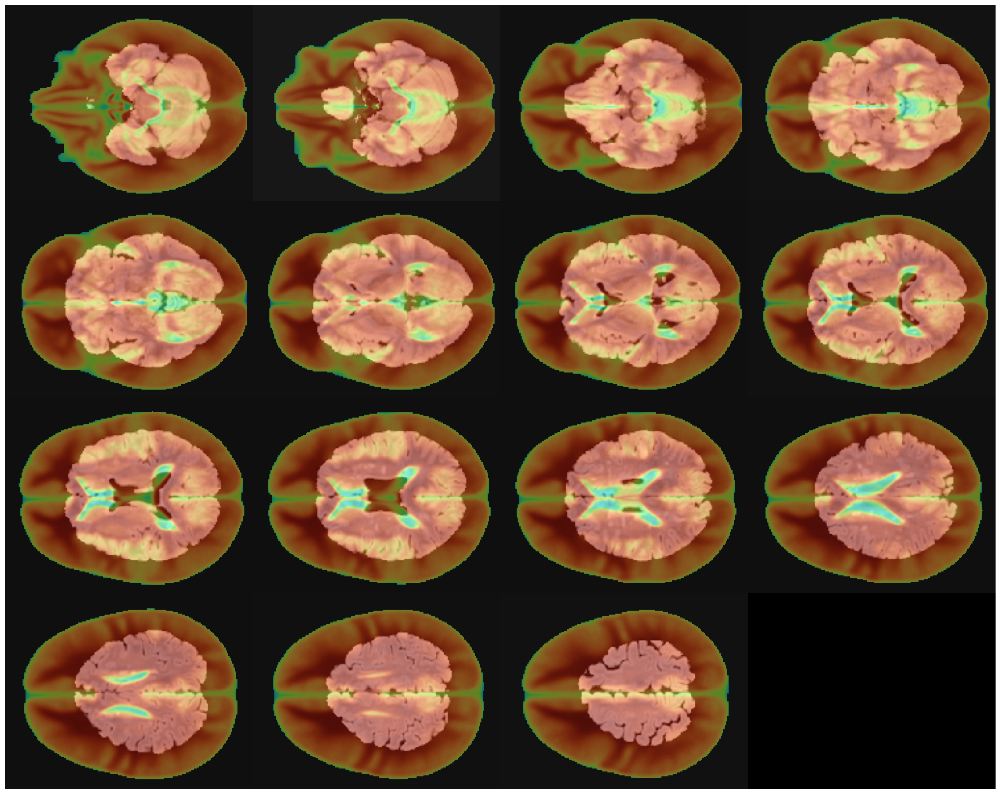

In [155]:
ants.plot(RMS01_flair_ants_re, overlay=atlas_ants, overlay_alpha = 0.5, axis=0, nslices=15, figsize=4)

In [80]:
RMS01_flair2atlas = ants.registration(fixed = atlas_ants, initial_transform = None,
                                moving = RMS01_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [81]:
RMS02_flair2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS02_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [82]:
RMS03_flair2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS03_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [83]:
RMS05_flair2atlas = ants.registration(fixed = atlas_ants,
                                moving = RMS05_flair_ants_re, 
                                type_of_transform = 'SyN',aff_metric='mattes')

In [186]:
import pickle 
  
try: 
    geeky_file = open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_flair2atlas', 'wb') 
    pickle.dump(RMS05_flair2atlas, geeky_file)
    geeky_file.close() 
  
except: 
    print("Something went wrong")

In [71]:
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_flair2atlas', 'rb') as f:
    RMS01_flair2atlas = pickle.load(f)
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS02_flair2atlas', 'rb') as f:
    RMS02_flair2atlas = pickle.load(f)
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS03_flair2atlas', 'rb') as f:
    RMS03_flair2atlas = pickle.load(f)
with open('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_flair2atlas', 'rb') as f:
    RMS05_flair2atlas = pickle.load(f)

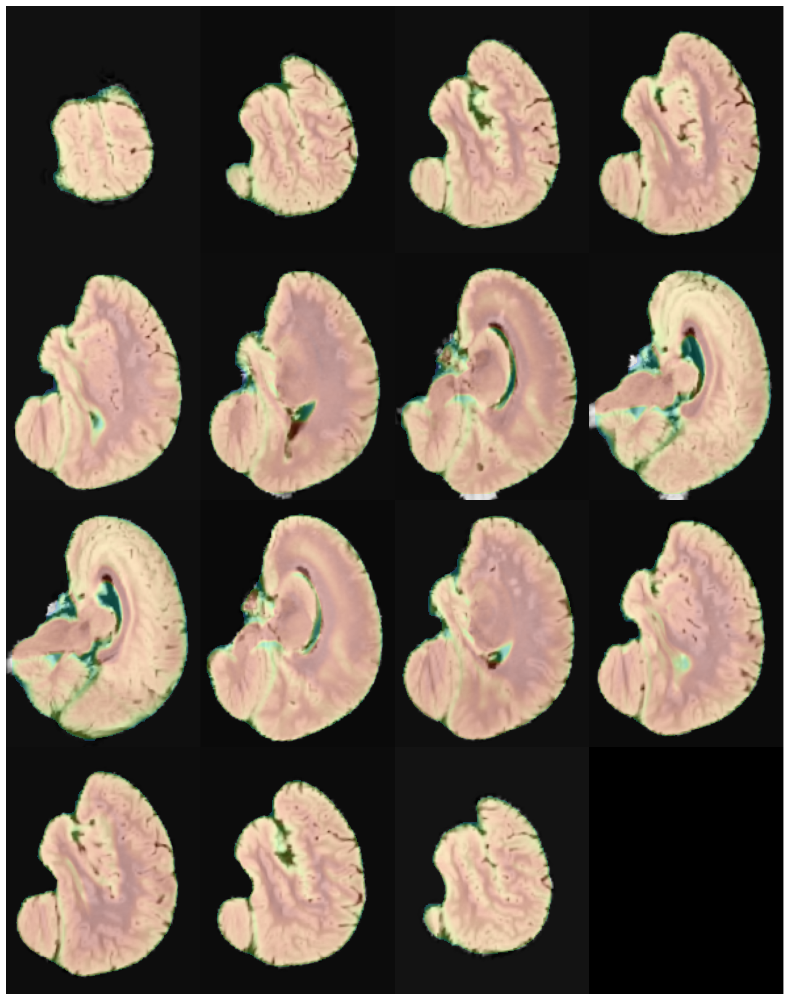

In [160]:
ants.plot(RMS05_flair2atlas['warpedmovout'], overlay=atlas_ants, overlay_alpha = 0.3, axis=2, nslices=15, figsize=4)

In [72]:
hylabelsRMS01_clustered_2highres = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS01/redo/hylabelsRMS01_clustered_2highres_resampled_ws_rwarp.nii").dataobj)
hylabelsRMS02_clustered_2highres = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS02/redo/hylabelsRMS02_clustered_2highres_resampled_ws_rwarp.nii").dataobj)
hylabelsRMS03_clustered_2highres = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS03/redo/hylabelsRMS03_clustered_2highres_resampled_ws_rwarp.nii").dataobj)
hylabelsRMS05_clustered_2highres = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/ms/RMS05/redo/hylabelsRMS05_clustered_2highres_resampled_ws_rwarp.nii").dataobj)

In [73]:
hylabelsRMS01_clustered_2highres_ants = ants.from_numpy(hylabelsRMS01_clustered_2highres)
hylabelsRMS02_clustered_2highres_ants = ants.from_numpy(hylabelsRMS02_clustered_2highres)
hylabelsRMS03_clustered_2highres_ants = ants.from_numpy(hylabelsRMS03_clustered_2highres)
hylabelsRMS05_clustered_2highres_ants = ants.from_numpy(hylabelsRMS05_clustered_2highres)

In [74]:
hylabelsRMS01_clustered_2highres_ants

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (256, 256, 256)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [75]:
hylabelsRMS01_clustered_2highres_ants_re = ants.resample_image(hylabelsRMS01_clustered_2highres_ants, (148, 188, 149), use_voxels=True, interp_type=1)
hylabelsRMS02_clustered_2highres_ants_re = ants.resample_image(hylabelsRMS02_clustered_2highres_ants, (148, 188, 149), use_voxels=True, interp_type=1)
hylabelsRMS03_clustered_2highres_ants_re = ants.resample_image(hylabelsRMS03_clustered_2highres_ants, (148, 188, 149), use_voxels=True, interp_type=1)
hylabelsRMS05_clustered_2highres_ants_re = ants.resample_image(hylabelsRMS05_clustered_2highres_ants, (148, 188, 149), use_voxels=True, interp_type=1)

In [76]:
hylabelsRMS01_clustered_2highres_ants_re.set_spacing((1,1,1))
hylabelsRMS02_clustered_2highres_ants_re.set_spacing((1,1,1))
hylabelsRMS03_clustered_2highres_ants_re.set_spacing((1,1,1))
hylabelsRMS05_clustered_2highres_ants_re.set_spacing((1,1,1))

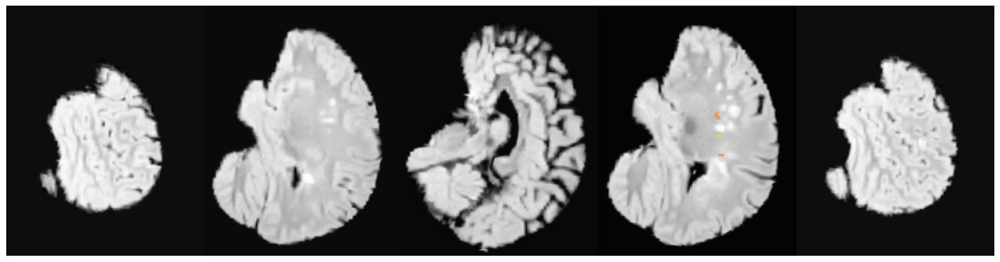

In [166]:
ants.plot(RMS01_flair2atlas['warpedmovout'], overlay=hylabelsRMS01_clustered_2highres_ants_re, overlay_alpha = 0.6, axis=2, nslices=5, figsize=4)

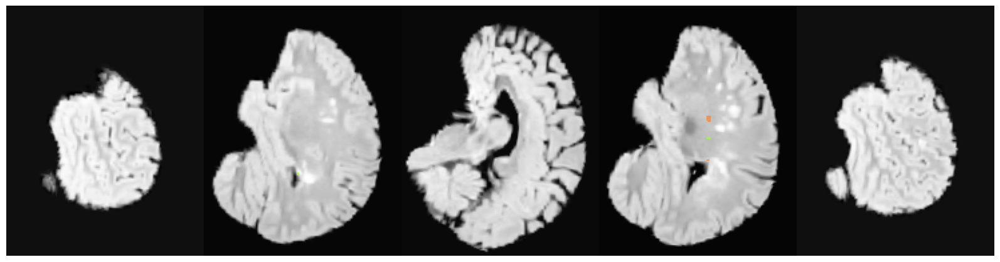

In [84]:
ants.plot(RMS01_flair2atlas['warpedmovout'], overlay=hylabelsRMS01_clustered_2highres_ants_re, overlay_alpha = 0.6, axis=2, nslices=5, figsize=4)

In [85]:
RMS01_labels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS01_clustered_2highres_ants_re, transformlist= RMS01_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
RMS02_labels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS02_clustered_2highres_ants_re, transformlist= RMS02_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
RMS03_labels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS03_clustered_2highres_ants_re, transformlist= RMS03_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
RMS05_labels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS05_clustered_2highres_ants_re, transformlist= RMS05_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)

['-d', '3', '-i', '0x7f1efd0574a8', '-o', '0x7f1efd057388', '-r', '0x7f1efd0574c8', '-n', 'nearestNeighbor', '-t', '/tmp/tmpg5tzzn8m1Warp.nii.gz', '-t', '/tmp/tmpg5tzzn8m0GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f1efd0574a8
Could not create ImageIO for the input file, assuming dimension = 3 and scalar pixel type
Reference image: 0x7f1efd0574c8
The composite transform comprises the following transforms (in order): 
  1. /tmp/tmpg5tzzn8m0GenericAffine.mat (type = AffineTransform)
  2. /tmp/tmpg5tzzn8m1Warp.nii.gz (type = DisplacementFieldTransform)
Default pixel value: 0
Interpolation type: NearestNeighborInterpolateImageFunction
Output warped image: 0x7f1efd057388
['-d', '3', '-i', '0x7f1efd0574c8', '-o', '0x7f1efd0574a8', '-r', '0x7f1efd057308', '-n', 'nearestNeighbor', '-t', '/tmp/tmpt_cpo2ue1Warp.nii.gz', '-t', '/tmp/tmpt_cpo2ue0GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f1efd0574c8
Could not create I

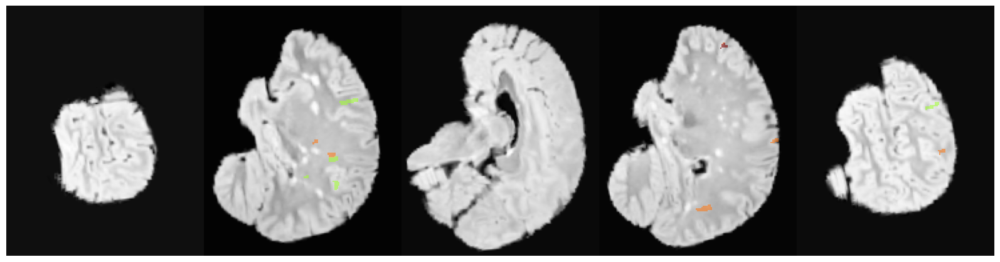

In [168]:
ants.plot(RMS02_flair2atlas['warpedmovout'], overlay=RMS02_labels2atlas, overlay_alpha = 0.6, axis=2, nslices=5, figsize=4)

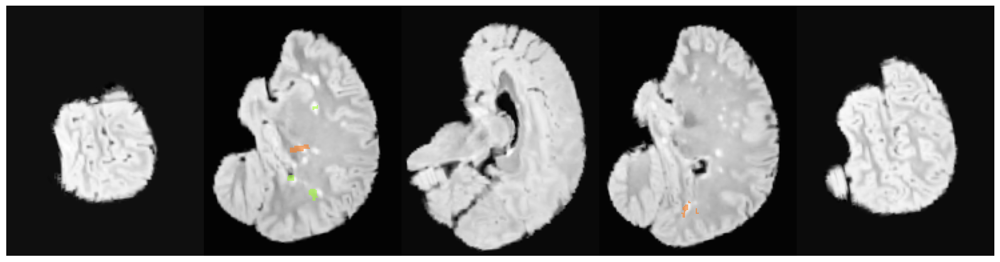

In [86]:
ants.plot(RMS02_flair2atlas['warpedmovout'], overlay=RMS02_labels2atlas, overlay_alpha = 0.6, axis=2, nslices=5, figsize=4)

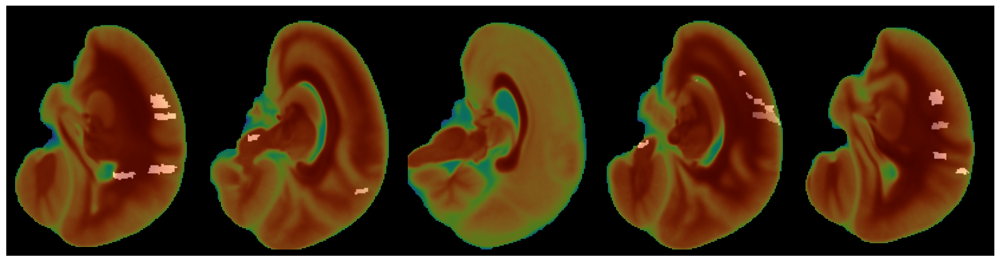

In [169]:
ants.plot(RMS01_labels2atlas, overlay=atlas_ants, overlay_alpha = 0.5, axis=2, nslices=5, figsize=4)

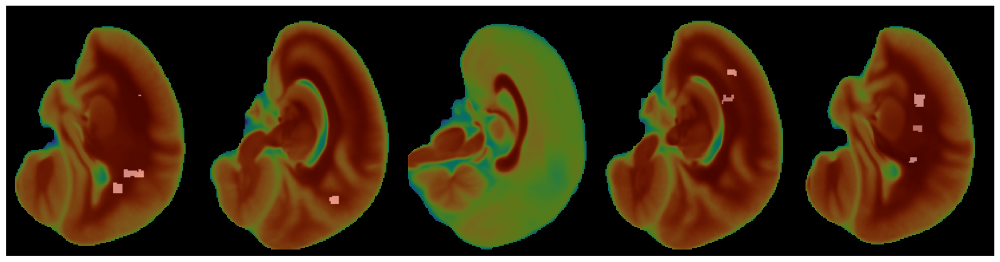

In [87]:
ants.plot(RMS01_labels2atlas, overlay=atlas_ants, overlay_alpha = 0.5, axis=2, nslices=5, figsize=4)

In [88]:
hylabelsRMS01_highreslabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/ms/RMS01/RMS01_Label_ss_256.nii").dataobj)
hylabelsRMS02_highreslabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/ms/RMS02/RMS02_Label_ss_256.nii").dataobj)
hylabelsRMS03_highreslabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/ms/RMS03/RMS03_Label_fixed.nii").dataobj)
hylabelsRMS05_highreslabels = np.array(nib.load("/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/ms/RMS05/RMS05_Label_fixed.nii").dataobj)

In [ ]:
hylabelsRMS05_highreslabels.shape

In [89]:
hylabelsRMS01_highreslabels_tp = np.rot90(np.fliplr(hylabelsRMS01_highreslabels))
hylabelsRMS02_highreslabels_tp = np.rot90(np.fliplr(hylabelsRMS02_highreslabels))
hylabelsRMS03_highreslabels_tp = np.flipud(np.transpose(hylabelsRMS03_highreslabels))
hylabelsRMS05_highreslabels_tp = np.transpose(np.flipud(np.fliplr(np.transpose(np.flip(hylabelsRMS05_highreslabels)))), (1, 0, 2))

In [90]:
#make labels match flair
labels_iso_5_flip_tp = np.transpose(labels_iso_5_flip)
labels_iso_5_flip_tp_lr = np.fliplr(labels_iso_5_flip_tp)
labels_iso_5_flip_tp_lr_ud = np.flipud(labels_iso_5_flip_tp_lr)
labels_iso_5_flip_tp_lr_ud_tp = np.transpose(labels_iso_5_flip_tp_lr_ud, (1, 0, 2))

NameError: name 'labels_iso_5_flip' is not defined

In [ ]:
plt.imshow(flair_5_tp[90,:,:], cmap='inferno')

In [ ]:
n=90
plt.imshow(flair_5_tp[n,:,:], cmap='inferno')
plt.imshow(hylabelsRMS05_highreslabels_tp[n,:,:], cmap='inferno', alpha=0.3)

In [91]:
hylabelsRMS01_highreslabels_tp_ants = ants.from_numpy(hylabelsRMS01_highreslabels_tp)
hylabelsRMS02_highreslabels_tp_ants = ants.from_numpy(hylabelsRMS02_highreslabels_tp)
hylabelsRMS03_highreslabels_tp_ants = ants.from_numpy(hylabelsRMS03_highreslabels_tp)
hylabelsRMS05_highreslabels_tp_ants = ants.from_numpy(hylabelsRMS05_highreslabels_tp)

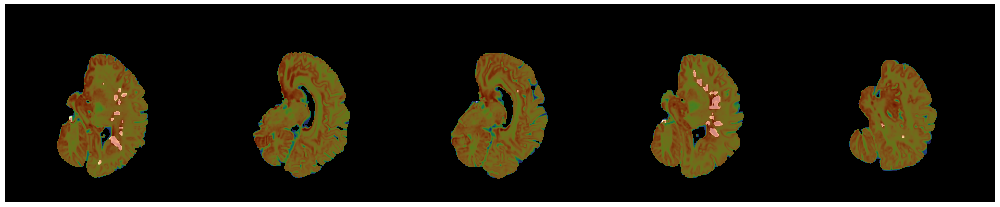

In [92]:
ants.plot(hylabelsRMS01_highreslabels_tp_ants, overlay=RMS01_flair_ants, overlay_alpha = 0.5, axis=2, nslices=5, figsize=4)

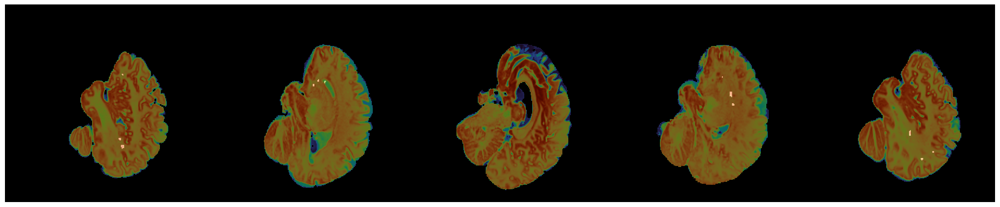

In [177]:
ants.plot(hylabelsRMS05_highreslabels_tp_ants, overlay=RMS05_flair_ants, overlay_alpha = 0.5, axis=2, nslices=5, figsize=4)

In [178]:
hylabelsRMS01_highreslabels_tp_ants_re = ants.resample_image(hylabelsRMS01_highreslabels_tp_ants, (148, 188, 149), use_voxels=True, interp_type=1)
hylabelsRMS02_highreslabels_tp_ants_re = ants.resample_image(hylabelsRMS02_highreslabels_tp_ants, (148, 188, 149), use_voxels=True, interp_type=1)
hylabelsRMS03_highreslabels_tp_ants_re = ants.resample_image(hylabelsRMS03_highreslabels_tp_ants, (148, 188, 149), use_voxels=True, interp_type=1)
hylabelsRMS05_highreslabels_tp_ants_re = ants.resample_image(hylabelsRMS05_highreslabels_tp_ants, (148, 188, 149), use_voxels=True, interp_type=1)

In [179]:
hylabelsRMS01_highreslabels_tp_ants_re.set_spacing((1,1,1))
hylabelsRMS02_highreslabels_tp_ants_re.set_spacing((1,1,1))
hylabelsRMS03_highreslabels_tp_ants_re.set_spacing((1,1,1))
hylabelsRMS05_highreslabels_tp_ants_re.set_spacing((1,1,1))

In [180]:
RMS01_highreslabels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS01_highreslabels_tp_ants_re, transformlist= RMS01_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
RMS02_highreslabels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS02_highreslabels_tp_ants_re, transformlist= RMS02_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
RMS03_highreslabels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS03_highreslabels_tp_ants_re, transformlist= RMS03_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)
RMS05_highreslabels2atlas = ants.apply_transforms(fixed=atlas_ants, moving=hylabelsRMS05_highreslabels_tp_ants_re, transformlist= RMS05_flair2atlas['fwdtransforms'], interpolator='nearestNeighbor', verbose=True)

['-d', '3', '-i', '0x7f65b7a832e8', '-o', '0x7f65b7a76ae8', '-r', '0x7f65b78b6828', '-n', 'nearestNeighbor', '-t', '/tmp/tmp56_14sbp1Warp.nii.gz', '-t', '/tmp/tmp56_14sbp0GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f65b7a832e8
Could not create ImageIO for the input file, assuming dimension = 3 and scalar pixel type
Reference image: 0x7f65b78b6828
The composite transform comprises the following transforms (in order): 
  1. /tmp/tmp56_14sbp0GenericAffine.mat (type = AffineTransform)
  2. /tmp/tmp56_14sbp1Warp.nii.gz (type = DisplacementFieldTransform)
Default pixel value: 0
Interpolation type: NearestNeighborInterpolateImageFunction
Output warped image: 0x7f65b7a76ae8
['-d', '3', '-i', '0x7f65b7a83a48', '-o', '0x7f65b78b6fe8', '-r', '0x7f65b7a832e8', '-n', 'nearestNeighbor', '-t', '/tmp/tmp04uujqq81Warp.nii.gz', '-t', '/tmp/tmp04uujqq80GenericAffine.mat']
Using double precision for computations.
Input scalar image: 0x7f65b7a83a48
Could not create I

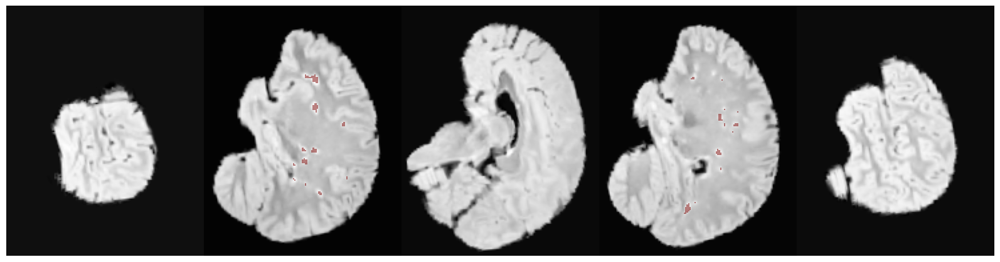

In [181]:
ants.plot(RMS02_flair2atlas['warpedmovout'], overlay=RMS02_highreslabels2atlas, overlay_alpha = 0.5, axis=2, nslices=5, figsize=4)

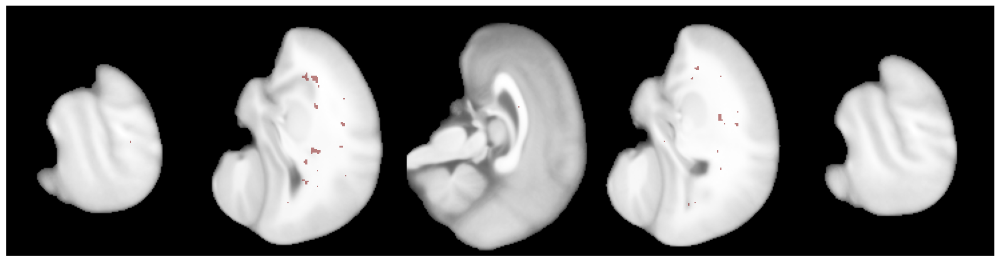

In [182]:
ants.plot(atlas_ants, overlay=RMS02_highreslabels2atlas, overlay_alpha = 0.5, axis=2, nslices=5, figsize=4)

In [183]:
RMS01_labels2atlas_npy = RMS01_labels2atlas.numpy()
RMS02_labels2atlas_npy = RMS02_labels2atlas.numpy()
RMS03_labels2atlas_npy = RMS03_labels2atlas.numpy()
RMS05_labels2atlas_npy = RMS05_labels2atlas.numpy()
atlas_ants_npy = atlas_ants.numpy()
RMS01_flair2atlas_npy = RMS01_flair2atlas['warpedmovout'].numpy()
RMS02_flair2atlas_npy = RMS02_flair2atlas['warpedmovout'].numpy()
RMS03_flair2atlas_npy = RMS03_flair2atlas['warpedmovout'].numpy()
RMS05_flair2atlas_npy = RMS05_flair2atlas['warpedmovout'].numpy()
RMS01_highreslabels2atlas_npy = RMS01_highreslabels2atlas.numpy()
RMS02_highreslabels2atlas_npy = RMS02_highreslabels2atlas.numpy()
RMS03_highreslabels2atlas_npy = RMS03_highreslabels2atlas.numpy()
RMS05_highreslabels2atlas_npy = RMS05_highreslabels2atlas.numpy()

In [184]:
RMS01_flair_ants_re_npy = RMS01_flair_ants_re.numpy()

In [93]:
RMS01_labels2atlas_npy = RMS01_labels2atlas.numpy()
RMS02_labels2atlas_npy = RMS02_labels2atlas.numpy()
RMS03_labels2atlas_npy = RMS03_labels2atlas.numpy()
RMS05_labels2atlas_npy = RMS05_labels2atlas.numpy()

In [95]:
ni_img = nib.Nifti1Image(RMS01_labels2atlas_npy, affine=np.eye(4))
nib.save(ni_img, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_labels2atlas_ws_rwarp.nii")
ni_img2 = nib.Nifti1Image(RMS02_labels2atlas_npy, affine=np.eye(4))
nib.save(ni_img2, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS02_labels2atlas_ws_rwarp.nii")
ni_img3 = nib.Nifti1Image(RMS03_labels2atlas_npy, affine=np.eye(4))
nib.save(ni_img3, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS03_labels2atlas_ws_rwarp.nii")
ni_img4 = nib.Nifti1Image(RMS05_labels2atlas_npy, affine=np.eye(4))
nib.save(ni_img4, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_labels2atlas_ws_rwarp.nii")

In [ ]:
ni_img5 = nib.Nifti1Image(atlas_ants_npy, affine=np.eye(4))
nib.save(ni_img5, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/atlas_ants.nii")

In [6]:
test1 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_labels2atlas_ws.nii').dataobj)
test2 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS02_labels2atlas_ws.nii').dataobj)
test3 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS03_labels2atlas_ws.nii').dataobj)
test5 = np.array(nib.load('/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_labels2atlas_ws.nii').dataobj)

In [8]:
print(np.unique(test1))
print(np.unique(test2))
print(np.unique(test3))
print(np.unique(test5))

[0. 1. 2. 3. 4.]
[0. 2. 3. 4.]
[0. 2. 3. 4.]
[0. 2. 3.]


In [9]:
test1 += 1
test2 += 1
test3 += 1
test5 += 1

In [10]:
print(np.unique(test1))
print(np.unique(test2))
print(np.unique(test3))
print(np.unique(test5))

[1. 2. 3. 4. 5.]
[1. 3. 4. 5.]
[1. 3. 4. 5.]
[1. 3. 4.]


In [11]:
#adding 1 to all labels and saving so we can see 0 values
ni_img = nib.Nifti1Image(test1, affine=np.eye(4))
nib.save(ni_img, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_labels2atlas_ws+1.nii")
ni_img2 = nib.Nifti1Image(test2, affine=np.eye(4))
nib.save(ni_img2, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS02_labels2atlas_ws+1.nii")
ni_img3 = nib.Nifti1Image(test3, affine=np.eye(4))
nib.save(ni_img3, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS03_labels2atlas_ws+1.nii")
ni_img4 = nib.Nifti1Image(test5, affine=np.eye(4))
nib.save(ni_img4, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_labels2atlas_ws+1.nii")

In [ ]:
ni_img6 = nib.Nifti1Image(RMS01_flair2atlas_npy, affine=np.eye(4))
nib.save(ni_img6, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_flair2atlas.nii")
ni_img7 = nib.Nifti1Image(RMS02_flair2atlas_npy, affine=np.eye(4))
nib.save(ni_img7, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS02_flair2atlas.nii")
ni_img8 = nib.Nifti1Image(RMS03_flair2atlas_npy, affine=np.eye(4))
nib.save(ni_img8, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS03_flair2atlas.nii")
ni_img9 = nib.Nifti1Image(RMS05_flair2atlas_npy, affine=np.eye(4))
nib.save(ni_img9, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_flair2atlas.nii")

In [ ]:
ni_img10 = nib.Nifti1Image(RMS01_highreslabels2atlas_npy, affine=np.eye(4))
nib.save(ni_img10, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_highreslabels2atlas.nii")
ni_img11 = nib.Nifti1Image(RMS02_highreslabels2atlas_npy, affine=np.eye(4))
nib.save(ni_img11, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS02_highreslabels2atlas.nii")
ni_img12 = nib.Nifti1Image(RMS03_highreslabels2atlas_npy, affine=np.eye(4))
nib.save(ni_img12, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS03_highreslabels2atlas.nii")
ni_img13 = nib.Nifti1Image(RMS05_highreslabels2atlas_npy, affine=np.eye(4))
nib.save(ni_img13, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS05_highreslabels2atlas.nii")
ni_img14 = nib.Nifti1Image(atlas_ants_npy, affine=np.eye(4))
nib.save(ni_img14, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/atlas_ants.nii")

In [51]:
atlas_ants_npy = atlas_ants.numpy()

In [52]:
ni_img14 = nib.Nifti1Image(atlas_ants_npy, affine=np.eye(4))
nib.save(ni_img14, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/atlas_ants.nii")

In [ ]:
ni_img10 = nib.Nifti1Image(RMS01_flair_ants_re_npy, affine=np.eye(4))
nib.save(ni_img10, "/data/MRSI/Naren2/FURI2/mayomrs_aligned/NarenTemplateSpace/Atlas_registration/RMS01_flair_ants_re.nii")

In [ ]:
hylabelsRMS02_clustered_2highres_resampled

In [ ]:
ants.plot(RMS02_flair_ants, overlay=hylabelsRMS02_clustered_2highres_resampled, overlay_alpha = 1, axis=1, nslices=10, figsize=4)